In [2]:
# might need to pip install yfinance
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import random
import import_ipynb
from AT_Setup import create_stocks_df, test_strategy, SMA_Backtester

# !pip install kaggle

C:\Users\ynakadi\Anaconda3\lib\site-packages\yfinance\base.py:48: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  _empty_series = pd.Series()


importing Jupyter notebook from AT_Setup.ipynb


In [3]:
sp500_df, stocks_df = create_stocks_df('2017-01-01','2024-03-01',16)

Unzipping: sp-500-stocks.zip


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [4]:
close_price_df = stocks_df.loc[:,['Close','company']].reset_index()

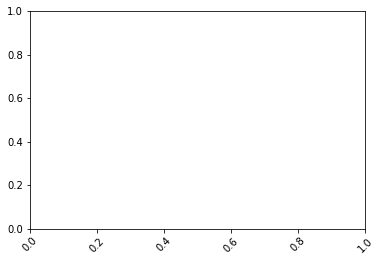

In [5]:
plt.xticks(rotation=45)
from matplotlib import rcParams

# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_df,x='Date',y='Close',color='company').update_layout(
    xaxis_title="Date", yaxis_title="Close Price ($)"
)

### Aggregate for Industry + Sector

In [6]:
industry_df = stocks_df.reset_index().merge(sp500_df[['Symbol','Sector','Industry']],left_on='company',right_on='Symbol').set_index('Date')

In [7]:
close_price_industry_df = industry_df.loc[:,['Close','Volume','Industry']].reset_index()
close_price_industry_df['Total'] = close_price_industry_df['Close'] * close_price_industry_df['Volume']
close_price_industry_df = close_price_industry_df.groupby(by=['Date','Industry']).sum().reset_index()
close_price_industry_df['mean_price']  = close_price_industry_df['Total']  / close_price_industry_df['Volume']
close_price_industry_df = close_price_industry_df[['Date','Industry','mean_price']]
close_price_industry_df
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_industry_df,x='Date',y='mean_price',color='Industry').update_layout(
    xaxis_title="Date", yaxis_title="Close Price (Averaged for Industry)"
)

In [ ]:
close_price_sector_df = industry_df.loc[:,['Close','Volume','Sector']].reset_index()
close_price_sector_df['Total'] = close_price_sector_df['Close'] * close_price_sector_df['Volume']
close_price_sector_df = close_price_sector_df.groupby(by=['Date','Sector']).sum().reset_index()
close_price_sector_df['Close']  = close_price_sector_df['Total']  / close_price_sector_df['Volume']
close_price_sector_df = close_price_sector_df[['Date','Sector','Close']]
close_price_sector_df

In [ ]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_sector_df,x='Date',y='Close',color='Sector').update_layout(
    xaxis_title="Date", yaxis_title="Close Price (Averaged for Sector)"
)

In [ ]:
for sector in set(close_price_sector_df['Sector']):
    sector_df = close_price_sector_df[close_price_sector_df['Sector'] == sector]
    stock_df = industry_df[industry_df['Sector'] == sector].reset_index()[['Date','Close','Symbol']]
    stock_df = stock_df.rename(columns = {'Symbol':'Sector'})
    merge_df = pd.concat([stock_df,sector_df])
    rcParams['figure.figsize'] = 11.7,8.27
    fig = px.line(merge_df,x='Date',y='Close',color='Sector').update_layout(
        xaxis_title="Date", yaxis_title="Close Price (Averaged for Sector)"
    )
    fig.show()
    

## Normalization

In [8]:
close_price_pivot_df = close_price_df.pivot(index='Date',columns='company',values='Close')
close_price_norm_df = close_price_pivot_df.div(close_price_pivot_df.iloc[0]).mul(100)
close_price_norm_df = close_price_norm_df.stack().reset_index().rename(columns={0:'Close'})

In [9]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_norm_df,x='Date',y='Close',color='company').update_layout(
    xaxis_title="Date", yaxis_title="Close Price (Normalized)"
)

### Delete Function

In [ ]:
# del (...) 

### Pct Change (for Pandas)

#### Daily Change

In [10]:
close_price_shift_df = close_price_pivot_df.shift(periods=1)
close_price_shift_df = close_price_shift_df.stack().reset_index().rename(columns={0:'Close'})

In [11]:
close_price_day_change_df = close_price_shift_df.merge(close_price_df, on = ['Date','company'])
close_price_day_change_df['pct_change'] = 100*(close_price_day_change_df.Close_y - close_price_day_change_df.Close_x) / close_price_day_change_df.Close_x


In [12]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_day_change_df,x='Date',y='pct_change',color='company').update_layout(
    xaxis_title="Date", yaxis_title="DoD Change in Stock Price"
)

#### Weekly Change

In [ ]:
close_price_shift_df = close_price_pivot_df.shift(periods=7)
close_price_shift_df = close_price_shift_df.stack().reset_index().rename(columns={0:'Close'})

In [ ]:
close_price_week_change_df = close_price_shift_df.merge(close_price_df, on = ['Date','company'])
close_price_week_change_df['pct_change'] = 100*(close_price_week_change_df.Close_y - close_price_week_change_df.Close_x) / close_price_week_change_df.Close_x

In [ ]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_week_change_df,x='Date',y='pct_change',color='company').update_layout(
    xaxis_title="Date", yaxis_title="WoW Change in Stock Price"
)

#### Monthly Change

In [ ]:
close_price_shift_df = close_price_pivot_df.shift(periods=30)
close_price_shift_df = close_price_shift_df.stack().reset_index().rename(columns={0:'Close'})

In [ ]:
close_price_month_change_df = close_price_shift_df.merge(close_price_df, on = ['Date','company'])
close_price_month_change_df['pct_change'] = 100*(close_price_month_change_df.Close_y - close_price_month_change_df.Close_x) / close_price_month_change_df.Close_x

In [ ]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_month_change_df,x='Date',y='pct_change',color='company').update_layout(
    xaxis_title="Date", yaxis_title="MoM Change in Stock Price"
)

#### Yearly Change

In [13]:
close_price_shift_df = close_price_pivot_df.shift(periods=365)
close_price_shift_df = close_price_shift_df.stack().reset_index().rename(columns={0:'Close'})

In [14]:
close_price_year_change_df = close_price_shift_df.merge(close_price_df, on = ['Date','company'])
close_price_year_change_df['pct_change'] = 100*(close_price_year_change_df.Close_y - close_price_year_change_df.Close_x) / close_price_year_change_df.Close_x

In [15]:
# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27
px.line(close_price_year_change_df,x='Date',y='pct_change',color='company').update_layout(
    xaxis_title="Date", yaxis_title="YoY Change in Stock Price"
)

### Specific Sample of Data

In [ ]:
# Last Day of Month
close_price_df.set_index("Date").resample("M").last()

# Last Business Day
close_price_df.set_index("Date").resample("BM").last()

### Scatter Plot (Expected Return vs Volatility)

In [16]:
company_comp_df = close_price_day_change_df[['company','pct_change']].groupby(by='company').agg({'pct_change':['mean','std']})

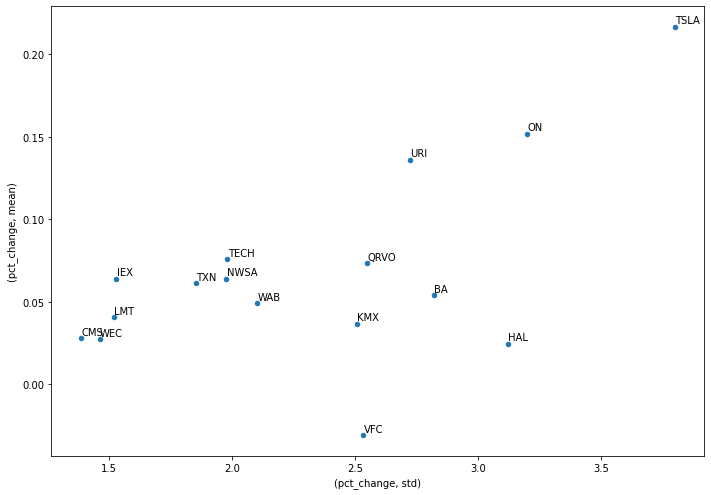

In [17]:
company_comp_df.plot.scatter(x=('pct_change','std'),y=('pct_change','mean'))
for i in company_comp_df.index:
    plt.annotate(i, xy= (company_comp_df.loc[i,('pct_change','std')]+2e-3, company_comp_df.loc[i,('pct_change','mean')]+2e-3))

### Correlation + Covariance

In [18]:
close_price_day_comp_df = close_price_day_change_df[['Date','company','pct_change']].pivot(index='Date',columns='company',values='pct_change')

#### Covariance

In [19]:
close_price_day_comp_df.cov()

company,BA,CMS,HAL,IEX,KMX,LMT,NWSA,ON,QRVO,TECH,TSLA,TXN,URI,VFC,WAB,WEC
company,,,,,,,,,,,,,,,,
BA,7.950798,1.032765,4.393428,1.886683,3.274848,1.802758,2.524825,4.244916,2.871926,1.618193,3.265950,2.167692,4.064235,3.038469,3.043869,0.891302
CMS,1.032765,1.917463,0.736046,0.793328,0.915385,0.919502,0.711667,0.551111,0.623728,0.620841,0.468607,0.687997,0.743232,1.067017,0.722352,1.792387
HAL,4.393428,0.736046,9.743751,2.071742,2.839534,1.662434,2.483813,4.333473,2.839670,1.223092,2.544836,2.294861,4.816593,2.995858,3.450286,0.589188
IEX,1.886683,0.793328,2.071742,2.335646,1.710070,0.983522,1.460127,2.413004,1.864357,1.354370,1.669261,1.570279,2.543480,1.777328,1.870705,0.699516
KMX,3.274848,0.915385,2.839534,1.710070,6.286364,1.036882,2.036188,3.552275,2.450843,1.668539,2.865215,1.877670,3.397388,2.924458,2.291901,0.861748
LMT,1.802758,0.919502,1.662434,0.983522,1.036882,2.306422,0.883425,0.972614,0.934188,0.631734,0.686715,0.947759,1.396702,1.101055,1.031455,0.932656
NWSA,2.524825,0.711667,2.483813,1.460127,2.036188,0.883425,3.906865,2.866479,2.182329,1.345389,2.033681,1.770182,2.763749,2.269524,1.940951,0.703775
ON,4.244916,0.551111,4.333473,2.413004,3.552275,0.972614,2.866479,10.251163,5.424781,2.675883,5.156761,4.181624,5.016243,3.343688,3.302387,0.328041
QRVO,2.871926,0.623728,2.839670,1.864357,2.450843,0.934188,2.182329,5.424781,6.504343,2.228194,3.520958,3.314990,3.508349,2.555338,2.350055,0.609910


#### Correlation

<Axes: xlabel='company', ylabel='company'>

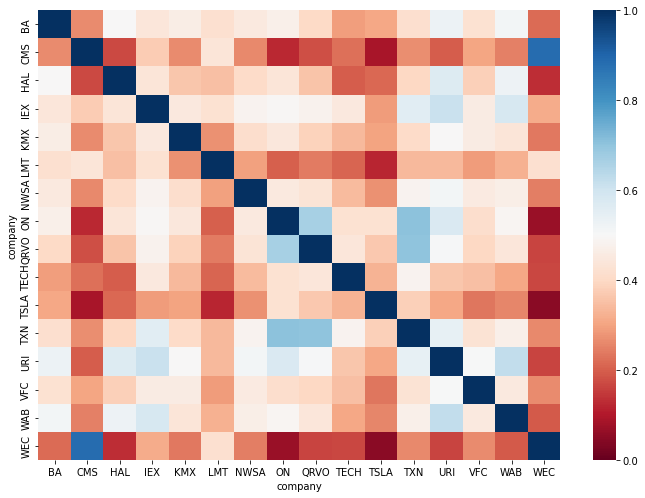

In [20]:
sns.heatmap(close_price_day_comp_df.corr(),cmap = 'RdBu',vmin = 0, vmax = 1)

## Simple returns and log returns

In [ ]:
# Simple returns can be misleading
# Log returns is muchhhh more accurate
# Forward fill fillna(method = 'ffill')
# Backward fill fillna(method = 'bfill')

## Cumulative Returns + Drawdowns

In [ ]:
# Cumulative Max (cummax)
# Cumulative Sum (cumsum)


4
NWSA
2020-04-03 00:00:00


WEC
2020-03-23 00:00:00


TECH
2023-11-01 00:00:00


QRVO
2022-10-12 00:00:00


CMS
2023-10-02 00:00:00


ON
2020-03-18 00:00:00


TXN
2020-03-16 00:00:00


BA
2020-03-20 00:00:00


HAL
2020-03-18 00:00:00


IEX
2020-03-18 00:00:00


KMX
2022-10-21 00:00:00


LMT
2020-03-23 00:00:00


VFC
2023-11-01 00:00:00


TSLA
2023-01-03 00:00:00


URI
2020-03-18 00:00:00


WAB
2020-03-20 00:00:00




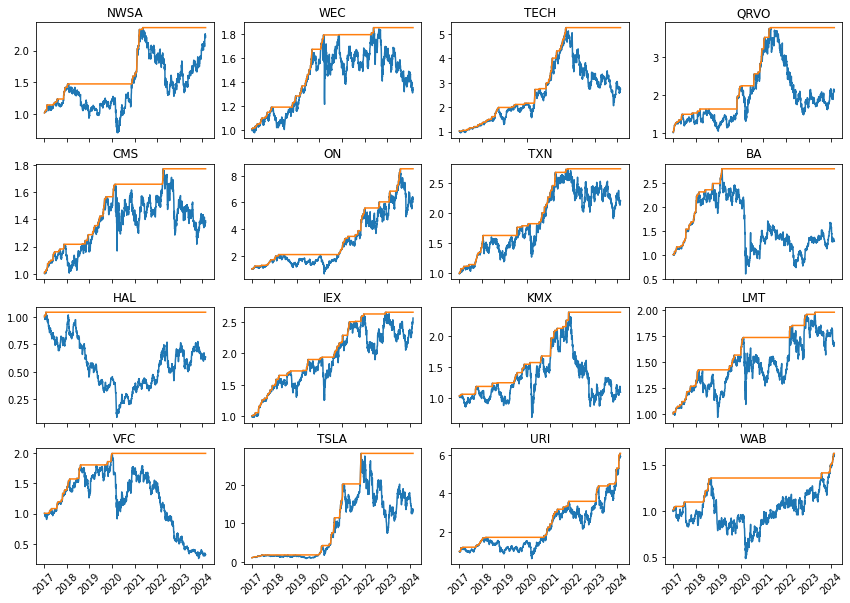

<Figure size 720x720 with 0 Axes>

In [23]:
companies = list(set(stocks_df['company']))
size = int(np.sqrt(len(companies)))
print(size)
fig, axs = plt.subplots(size,size,sharex=True,layout='constrained')
plt.figure(figsize=(10,10))
for i in range(len(companies)):
    x = i // size
    y = i % size
    company = companies[i]
    returns_df = stocks_df[stocks_df['company']==company][['Close']]
    returns_df['d_returns'] = np.log(returns_df[['Close']].div(returns_df[['Close']].shift(1)))
    returns_df['cum_returns'] = returns_df.d_returns.cumsum().apply(np.exp)
    returns_df['cum_max'] = returns_df.cum_returns.cummax()
    returns_df['Drawdown_Percentage'] = (returns_df['cum_max'] - returns_df['cum_returns']) / returns_df['cum_max']
    print(company)
    print(returns_df.Drawdown_Percentage.idxmax())
    print('\n')
    axs[x,y].plot(returns_df[['cum_returns','cum_max']])
    axs[x,y].tick_params(axis='x', rotation=45)
    axs[x,y].title.set_text(str(company)) 
